In [66]:
import pandas as pd
from utils.utils import EnsembleProjections
# from utils.eda_utils import FeatureEngineering, EDAUtils, Filters
import os
import joblib
import numpy as np

In [67]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [68]:
ep = EnsembleProjections()
# fe = FeatureEngineering()
# edau = EDAUtils()
# filter_utils = Filters()

In [69]:
# Set up paths
SCRIPT_DIR_PATH = os.getcwd()
ROOT_DIR_PATH = os.path.dirname(SCRIPT_DIR_PATH)
ML_DIR_PATH = os.path.join(ROOT_DIR_PATH, "ml")
ML_OUTPUT_DIR_PATH = os.path.join(ML_DIR_PATH, "output")
ARIMA_OUTPUT_DIR_PATH = os.path.join(SCRIPT_DIR_PATH, "output")
ENSEMBLE_DIR_PATH = os.path.join(ARIMA_OUTPUT_DIR_PATH, "ensemble")
TRAINING_DIR_PATH = os.path.join(ML_OUTPUT_DIR_PATH, "training")
CONFIG_DIR_PATH = os.path.join(SCRIPT_DIR_PATH, "config")
MODELS_DIR_PATH = os.path.join(ML_OUTPUT_DIR_PATH, "models")
POSTPROCESSING_DIR_PATH = os.path.join(ARIMA_OUTPUT_DIR_PATH, "postprocessed_ensemble")
os.makedirs(ENSEMBLE_DIR_PATH, exist_ok=True)
os.makedirs(POSTPROCESSING_DIR_PATH, exist_ok=True)
HP_FILTERED_DIR_PATH = os.path.join(ARIMA_OUTPUT_DIR_PATH, "hp_filtered")

In [70]:
# Ensemble params
# run_id = 1778430149
run_id = 1778464552
# Load data
training_df_log_transformed = pd.read_csv(os.path.join(TRAINING_DIR_PATH, f"training_df_{run_id}.csv"))
ensemble_arima_df = pd.read_parquet(os.path.join(ENSEMBLE_DIR_PATH, f"ensemble_arima_{run_id}.parquet"))

In [71]:
# Print shapes
print(f"Training df log transformed shape: {training_df_log_transformed.shape}")
print(f"Ensemble ARIMA df shape: {ensemble_arima_df.shape}") 

Training df log transformed shape: (2856, 26)
Ensemble ARIMA df shape: (1224000, 27)


In [72]:
# Get the models from the models directory with keys without .pkl extension
models = {}
for model_name in os.listdir(MODELS_DIR_PATH):
    if model_name.endswith(".pkl"):
        model_path = os.path.join(MODELS_DIR_PATH, model_name)
        key_name = model_name[:-4]  # remove .pkl extension
        models[key_name] = joblib.load(model_path)

models.keys()

/home/tony/miniconda3/envs/etpe_env/lib/python3.12/site-packages/sklearn/base.py:463: InconsistentVersionWarning: Trying to unpickle estimator SimpleImputer from version 1.7.1 when using version 1.8.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/tony/miniconda3/envs/etpe_env/lib/python3.12/site-packages/sklearn/base.py:463: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.7.1 when using version 1.8.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/tony/miniconda3/envs/etpe_env/lib/python3.12/site-packages/sklearn/base.py:463: InconsistentVersionWarning: Trying to unpickle estimator Pipeline from version 

dict_keys(['enet_pipeline_1771445441', 'enet_pipeline_1773099288', 'enet_pipeline_1773092655', 'enet_pipeline_1775599514', 'enet_pipeline_1773096894', 'enet_pipeline_1778428817', 'enet_pipeline_1778430149', 'enet_pipeline_1775688695', 'enet_pipeline_1773187462', 'enet_pipeline_1773189922', 'enet_pipeline_1771005437', 'enet_pipeline_1775599069', 'enet_pipeline_1775605966', 'enet_pipeline_1775680762', 'enet_pipeline_1773188058', 'enet_pipeline_1778464552', 'enet_pipeline_1773091789'])

In [73]:
# Get a df with only iso_alpha_3
iso_alpha_3_cols = ["iso_alpha_3"]
income_group_region_mapping_df = training_df_log_transformed[iso_alpha_3_cols].drop_duplicates().reset_index(drop=True)
income_group_region_mapping_df.head()

,iso_alpha_3
0,AFG
1,AGO
2,ALB
3,ARG
4,ARM


In [74]:
training_df_log_transformed.columns

Index(['iso_alpha_3', 'year', 'cap_liberal_democracy_idx',
       'cap_corruption_idx', 'cap_control_corruption',
       'cap_govt_effectiveness', 'cap_regulatory_quality',
       'cap_voice_accountability', 'con_ndgain_score',
       'con_ndgain_vulnerability', 'con_renewables_share_elec_pct',
       'inc_has_carbon_tax', 'inc_has_framework_law',
       'inc_has_renewable_target', 'inc_has_efficiency_standard',
       'x_log_signed_con_coal', 'x_log_signed_con_hydro',
       'x_log_signed_con_edgar_ghg_mt', 'x_log_signed_con_demand',
       'x_log_signed_con_primary_energy_twh', 'x_log_signed_con_other_fossil',
       'x_log_signed_con_demand_per_capita',
       'x_log_signed_con_energy_per_capita_kwh',
       'x_log_signed_cap_gdp_per_capita_ppp_current',
       'x_log_signed_inc_carbon_pricing_coverage',
       'x_log_signed_con_electricity_access_pct'],
      dtype='str')

In [75]:
training_df_log_transformed.year.max()

np.int64(2022)

In [76]:
emission_init_cond_df = training_df_log_transformed[training_df_log_transformed["year"] == 2022].copy()
emission_init_cond_df = emission_init_cond_df.reset_index(drop=True)
emission_init_cond_df = emission_init_cond_df[["iso_alpha_3", "year", "x_log_signed_con_edgar_ghg_mt"]]
emission_init_cond_df

,iso_alpha_3,year,x_log_signed_con_edgar_ghg_mt
0,AFG,2022,3.771798
1,AGO,2022,4.937669
2,ALB,2022,2.306895
3,ARG,2022,6.067426
4,ARM,2022,2.463935
...,...,...,...
131,USA,2022,8.547421
132,UZB,2022,5.295285
133,ZAF,2022,6.215353
134,ZMB,2022,1.492873


In [77]:
training_df_log_transformed.columns

Index(['iso_alpha_3', 'year', 'cap_liberal_democracy_idx',
       'cap_corruption_idx', 'cap_control_corruption',
       'cap_govt_effectiveness', 'cap_regulatory_quality',
       'cap_voice_accountability', 'con_ndgain_score',
       'con_ndgain_vulnerability', 'con_renewables_share_elec_pct',
       'inc_has_carbon_tax', 'inc_has_framework_law',
       'inc_has_renewable_target', 'inc_has_efficiency_standard',
       'x_log_signed_con_coal', 'x_log_signed_con_hydro',
       'x_log_signed_con_edgar_ghg_mt', 'x_log_signed_con_demand',
       'x_log_signed_con_primary_energy_twh', 'x_log_signed_con_other_fossil',
       'x_log_signed_con_demand_per_capita',
       'x_log_signed_con_energy_per_capita_kwh',
       'x_log_signed_cap_gdp_per_capita_ppp_current',
       'x_log_signed_inc_carbon_pricing_coverage',
       'x_log_signed_con_electricity_access_pct'],
      dtype='str')

In [78]:
features_init_cond_df = training_df_log_transformed[training_df_log_transformed["year"] == 2022].copy()
features_init_cond_df = features_init_cond_df.reset_index(drop=True)
features_init_cond_df

,iso_alpha_3,year,cap_liberal_democracy_idx,cap_corruption_idx,cap_control_corruption,cap_govt_effectiveness,cap_regulatory_quality,cap_voice_accountability,con_ndgain_score,con_ndgain_vulnerability,...,x_log_signed_con_hydro,x_log_signed_con_edgar_ghg_mt,x_log_signed_con_demand,x_log_signed_con_primary_energy_twh,x_log_signed_con_other_fossil,x_log_signed_con_demand_per_capita,x_log_signed_con_energy_per_capita_kwh,x_log_signed_cap_gdp_per_capita_ppp_current,x_log_signed_inc_carbon_pricing_coverage,x_log_signed_con_electricity_access_pct
0,AFG,2022,0.012,0.567,-1.183684,-1.880035,-1.271806,-1.753529,32.633596,0.587796,...,0.385262,3.771798,2.059239,3.830943,0.215111,0.157004,7.014431,7.661054,0.0,4.457830
1,AGO,2022,0.154,0.564,-0.612376,-1.026034,-0.606699,-0.807578,36.894235,0.508757,...,1.553925,4.937669,2.907447,4.581973,0.970779,0.398776,7.906482,9.168397,0.0,3.901973
2,ALB,2022,0.433,0.558,-0.408189,0.064541,0.159354,0.141740,49.348682,0.380609,...,1.249902,2.306895,2.184927,3.290824,0.095310,1.332366,9.121313,10.000318,0.0,4.615121
3,ARG,2022,0.661,0.480,-0.447222,-0.283490,-0.697566,0.546317,47.833398,0.381499,...,2.432736,6.067426,5.071981,6.909994,1.710188,1.501853,10.001110,10.302593,0.0,4.615121
4,ARM,2022,0.443,0.320,0.027907,-0.314792,-0.019079,0.090326,56.413472,0.359561,...,0.854415,2.463935,2.243896,3.952320,0.000000,1.368639,9.782635,9.860704,0.0,4.615121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131,USA,2022,0.763,0.059,1.104145,1.255496,1.424440,0.860348,66.380423,0.311794,...,4.448867,8.547421,8.373115,10.185410,3.531641,2.615204,11.259693,11.262692,0.0,4.615121
132,UZB,2022,0.080,0.826,-0.757770,-0.329937,-0.550315,-1.330924,50.761586,0.359824,...,1.172482,5.295285,4.361824,6.386074,1.088562,1.169381,9.738600,9.239271,0.0,4.615121
133,ZAF,2022,0.605,0.448,-0.330095,-0.109028,-0.185126,0.723274,46.395526,0.395067,...,0.559616,6.215353,5.473656,7.205761,1.229641,1.570697,9.979601,9.599002,0.0,4.471639
134,ZMB,2022,0.439,0.378,-0.504948,-0.638017,-0.529058,-0.079451,40.375415,0.486409,...,1.427916,1.492873,2.858193,3.714547,0.173953,0.598837,7.594785,8.253677,0.0,3.887730


In [79]:
ensemble_arima_df.head()

,iso_alpha_3,future_id,year,x_log_signed_con_primary_energy_twh,x_log_signed_con_energy_per_capita_kwh,x_log_signed_cap_gdp_per_capita_ppp_current,x_log_signed_con_demand,x_log_signed_con_hydro,cap_control_corruption,con_ndgain_vulnerability,...,cap_regulatory_quality,x_log_signed_con_other_fossil,x_log_signed_inc_carbon_pricing_coverage,inc_has_renewable_target,cap_voice_accountability,cap_liberal_democracy_idx,inc_has_carbon_tax,inc_has_efficiency_standard,inc_has_framework_law,em_lag_1y
0,AFG,id_AFG_1,2022,3.830943,7.014431,7.661054,2.059239,0.385262,-1.183684,0.587796,...,-1.271806,0.215111,0.00000,0.0,-1.753529,0.012,0.0,0.0,0.0,3.792831
1,AFG,id_AFG_1,2023,3.901834,7.116108,7.569834,2.152913,0.406677,-1.196017,0.584513,...,-1.255955,0.219880,0.00000,0.0,-1.602390,0.000,0.0,0.0,0.0,3.771798
2,AFG,id_AFG_1,2024,4.211676,7.224632,7.571661,2.308337,0.418196,-1.192289,0.579811,...,-1.236550,0.213054,0.00000,0.0,-1.425350,0.000,0.0,0.0,0.0,3.778336
3,AFG,id_AFG_1,2025,4.571651,7.055374,7.444764,2.377313,0.417804,-1.184356,0.583488,...,-1.228611,0.227065,0.00000,0.0,-1.257296,0.000,0.0,0.0,0.0,3.784875
4,AFG,id_AFG_1,2026,4.781298,7.093249,7.296884,2.299832,0.409935,-1.090149,0.575209,...,-1.240078,0.221306,0.00004,0.0,-1.153197,0.000,0.0,0.0,0.0,3.791413


## Let's check the feature variables projections

In [80]:
ensemble_arima_df.columns

Index(['iso_alpha_3', 'future_id', 'year',
       'x_log_signed_con_primary_energy_twh',
       'x_log_signed_con_energy_per_capita_kwh',
       'x_log_signed_cap_gdp_per_capita_ppp_current',
       'x_log_signed_con_demand', 'x_log_signed_con_hydro',
       'cap_control_corruption', 'con_ndgain_vulnerability',
       'x_log_signed_con_demand_per_capita', 'x_log_signed_con_coal',
       'cap_govt_effectiveness', 'x_log_signed_con_electricity_access_pct',
       'con_ndgain_score', 'cap_corruption_idx',
       'con_renewables_share_elec_pct', 'cap_regulatory_quality',
       'x_log_signed_con_other_fossil',
       'x_log_signed_inc_carbon_pricing_coverage', 'inc_has_renewable_target',
       'cap_voice_accountability', 'cap_liberal_democracy_idx',
       'inc_has_carbon_tax', 'inc_has_efficiency_standard',
       'inc_has_framework_law', 'em_lag_1y'],
      dtype='str')

In [81]:
iso = "USA"

columns = {
    "em_lag_1y": "One-year lag of greenhouse gas emissions",
    "x_log_signed_con_primary_energy_twh": "Signed log of primary energy consumption in terawatt-hours",
    "x_log_signed_con_energy_per_capita_kwh": "Signed log of energy consumption per capita in kilowatt-hours",
    "x_log_signed_con_demand": "Signed log of electricity demand",
    "x_log_signed_cap_gdp_per_capita_ppp_current": "Signed log of GDP per capita at current purchasing power parity",
    "x_log_signed_con_hydro": "Signed log of hydroelectricity generation",
    "cap_control_corruption": "Control of corruption index",
    "con_ndgain_vulnerability": "ND-GAIN climate vulnerability score",
    "x_log_signed_con_coal": "Signed log of coal electricity generation",
    "x_log_signed_con_demand_per_capita": "Signed log of electricity demand per capita",
    "cap_govt_effectiveness": "Government effectiveness index",
    "x_log_signed_con_electricity_access_pct": "Signed log of population with access to electricity",
    "x_log_signed_con_other_fossil": "Signed log of electricity generation from other fossil fuels",
    "con_ndgain_score": "ND-GAIN climate readiness and vulnerability score",
    "con_renewables_share_elec_pct": "Renewables share of electricity generation",
    "inc_has_carbon_tax": "Indicator for whether a carbon tax is in place",
    "cap_regulatory_quality": "Regulatory quality index",
    "cap_corruption_idx": "Corruption index",
    "x_log_signed_inc_carbon_pricing_coverage": "Signed log of carbon pricing coverage",
    "inc_has_renewable_target": "Indicator for whether a renewable energy target is in place",
    "cap_voice_accountability": "Voice and accountability index",
    "cap_liberal_democracy_idx": "Liberal democracy index",
    # "cap_political_stability": "Political stability index",
    "inc_has_framework_law": "Indicator for whether a climate framework law is in place",
}


panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]



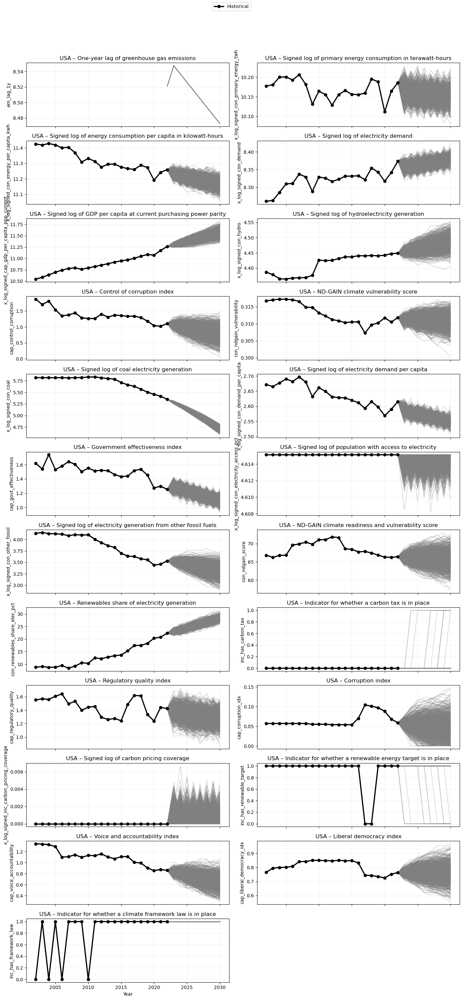

In [82]:
ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 30)
)


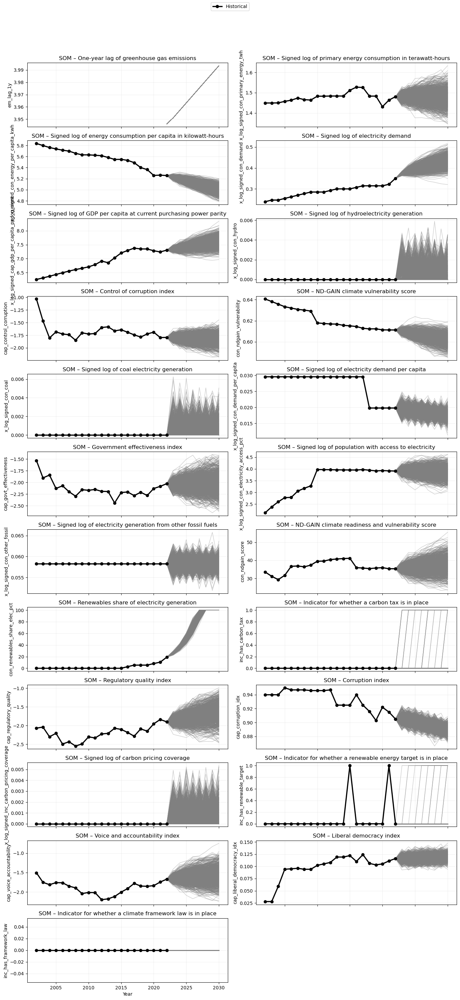

In [83]:
iso = "SOM"

panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]

ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 30),
)


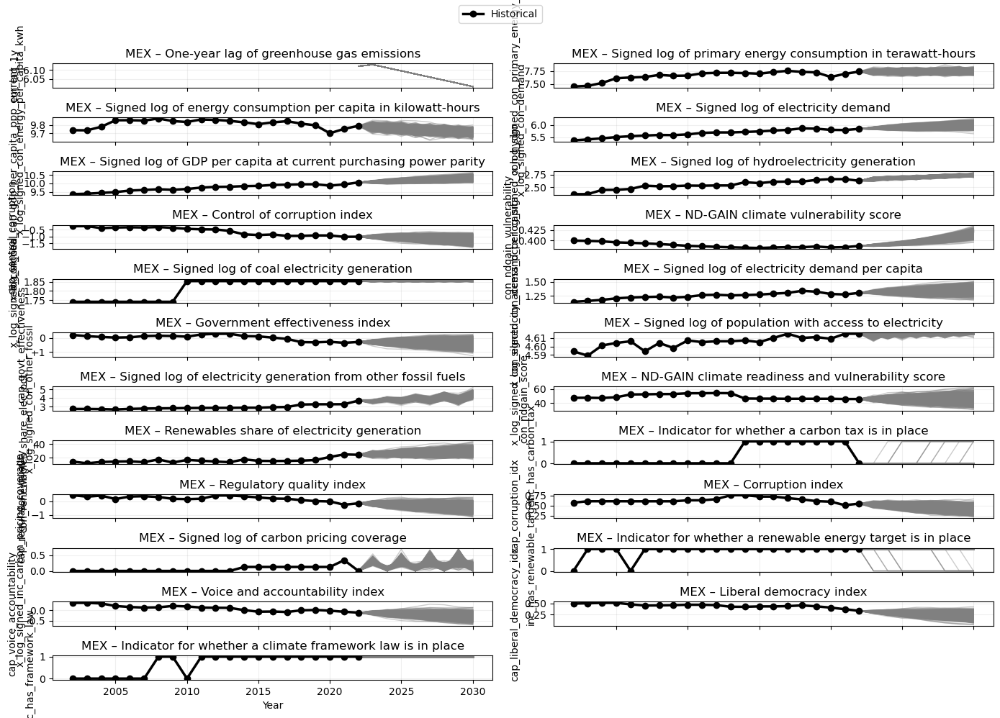

In [84]:
iso = "MEX"

panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]

ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 10),
)


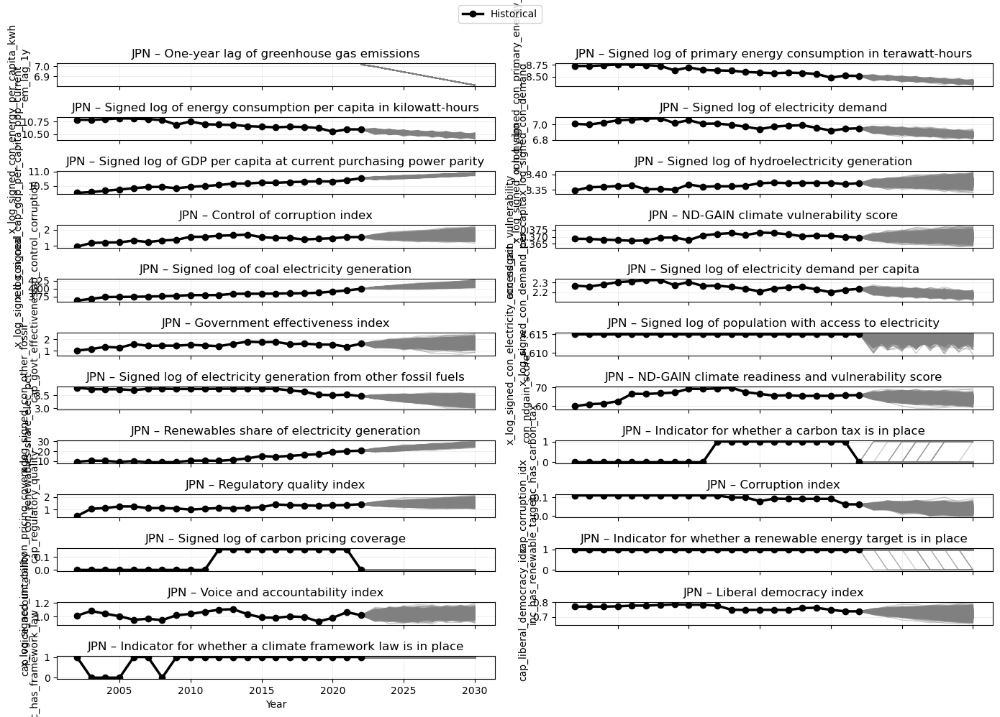

In [85]:
iso = "JPN"

panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]

ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 10)
)

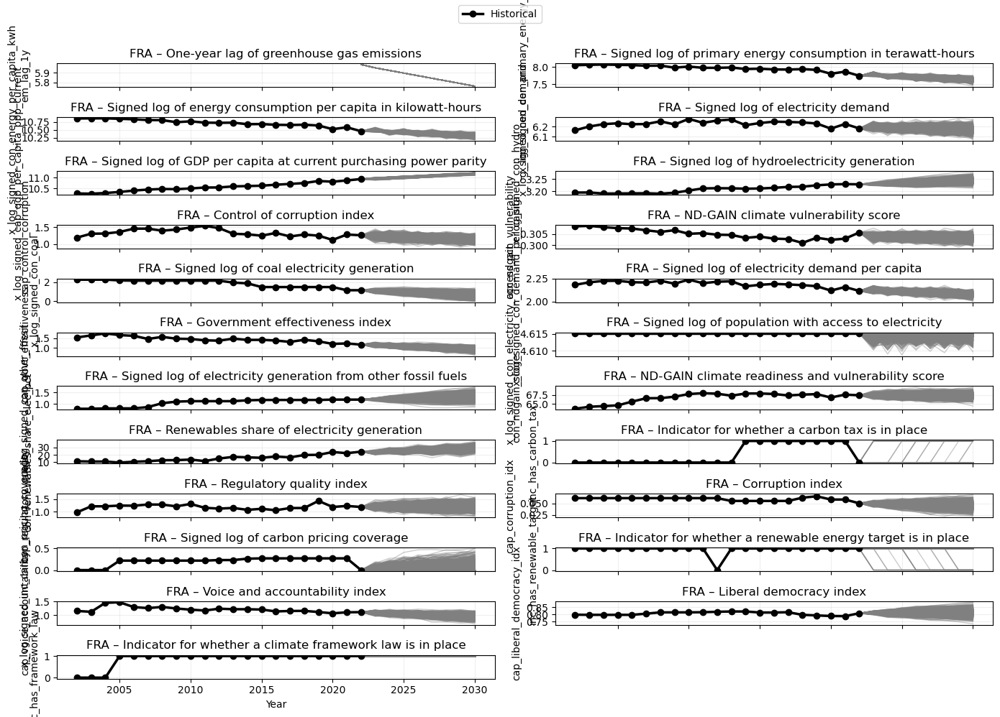

In [86]:
iso = "FRA"

panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]

ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 10)
)

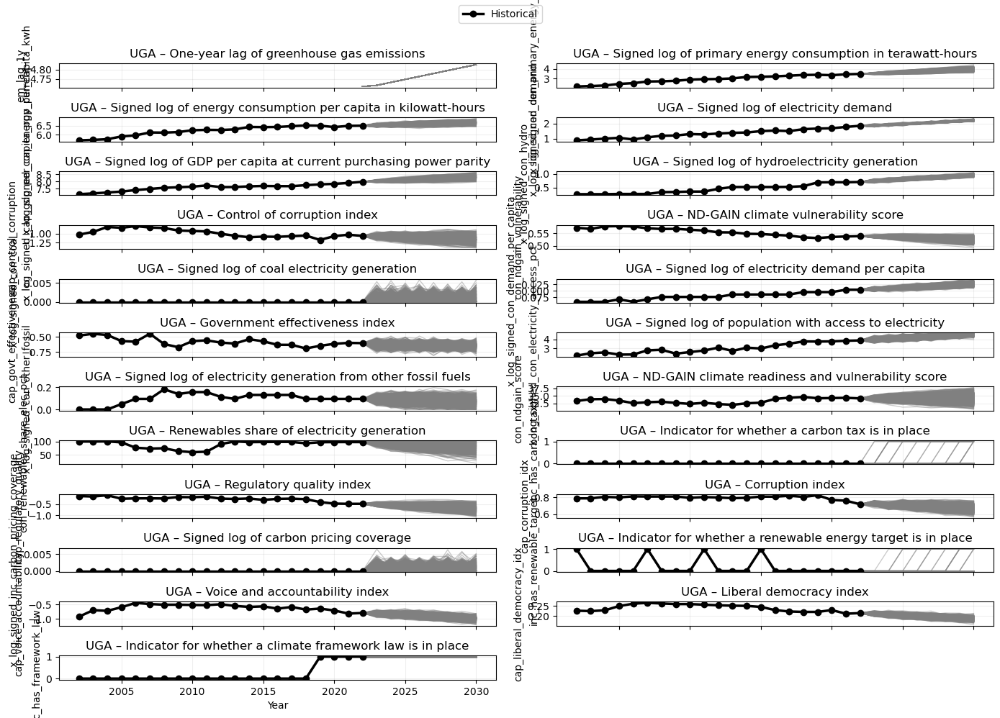

In [87]:
iso="UGA"

panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]

ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 10)
)

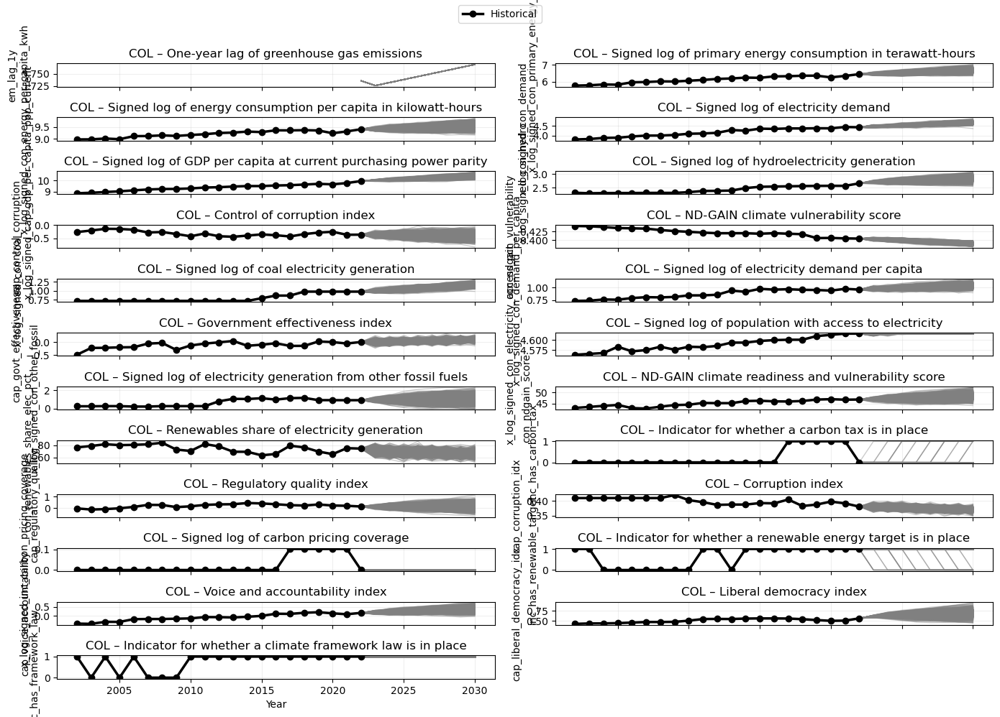

In [88]:
iso="COL"

panels = [
    {"iso": iso, "column": col, "title": f"{iso} – {label}"}
    for col, label in columns.items()
]

ep.plot_ensemble_time_series_grid(
    df=ensemble_arima_df,
    hist_df=training_df_log_transformed,
    panels=panels,
    ncols=2,
    figsize=(14, 10)
)

## Predict

In [89]:
training_df_log_transformed.columns

Index(['iso_alpha_3', 'year', 'cap_liberal_democracy_idx',
       'cap_corruption_idx', 'cap_control_corruption',
       'cap_govt_effectiveness', 'cap_regulatory_quality',
       'cap_voice_accountability', 'con_ndgain_score',
       'con_ndgain_vulnerability', 'con_renewables_share_elec_pct',
       'inc_has_carbon_tax', 'inc_has_framework_law',
       'inc_has_renewable_target', 'inc_has_efficiency_standard',
       'x_log_signed_con_coal', 'x_log_signed_con_hydro',
       'x_log_signed_con_edgar_ghg_mt', 'x_log_signed_con_demand',
       'x_log_signed_con_primary_energy_twh', 'x_log_signed_con_other_fossil',
       'x_log_signed_con_demand_per_capita',
       'x_log_signed_con_energy_per_capita_kwh',
       'x_log_signed_cap_gdp_per_capita_ppp_current',
       'x_log_signed_inc_carbon_pricing_coverage',
       'x_log_signed_con_electricity_access_pct'],
      dtype='str')

In [90]:
# Set up target variables
log_target_variable = "x_log_signed_con_edgar_ghg_mt"
target_variable = "con_edgar_ghg_mt"
target_variable_list = [log_target_variable, target_variable]


# Remove log transformation from target variable
training_df_log_transformed[target_variable] = np.expm1(training_df_log_transformed[log_target_variable])
training_df_log_transformed[target_variable].describe()

count     2856.000000
mean       260.496069
std       1059.698261
min         -0.995942
25%          9.912162
50%         43.210065
75%        123.237151
max      13519.994524
Name: con_edgar_ghg_mt, dtype: float64

In [91]:
# Get feature cols
feature_cols = [c for c in  training_df_log_transformed.columns if c not in target_variable_list]
feature_cols

['iso_alpha_3',
 'year',
 'cap_liberal_democracy_idx',
 'cap_corruption_idx',
 'cap_control_corruption',
 'cap_govt_effectiveness',
 'cap_regulatory_quality',
 'cap_voice_accountability',
 'con_ndgain_score',
 'con_ndgain_vulnerability',
 'con_renewables_share_elec_pct',
 'inc_has_carbon_tax',
 'inc_has_framework_law',
 'inc_has_renewable_target',
 'inc_has_efficiency_standard',
 'x_log_signed_con_coal',
 'x_log_signed_con_hydro',
 'x_log_signed_con_demand',
 'x_log_signed_con_primary_energy_twh',
 'x_log_signed_con_other_fossil',
 'x_log_signed_con_demand_per_capita',
 'x_log_signed_con_energy_per_capita_kwh',
 'x_log_signed_cap_gdp_per_capita_ppp_current',
 'x_log_signed_inc_carbon_pricing_coverage',
 'x_log_signed_con_electricity_access_pct']

In [92]:
models.keys()

dict_keys(['enet_pipeline_1771445441', 'enet_pipeline_1773099288', 'enet_pipeline_1773092655', 'enet_pipeline_1775599514', 'enet_pipeline_1773096894', 'enet_pipeline_1778428817', 'enet_pipeline_1778430149', 'enet_pipeline_1775688695', 'enet_pipeline_1773187462', 'enet_pipeline_1773189922', 'enet_pipeline_1771005437', 'enet_pipeline_1775599069', 'enet_pipeline_1775605966', 'enet_pipeline_1775680762', 'enet_pipeline_1773188058', 'enet_pipeline_1778464552', 'enet_pipeline_1773091789'])

In [93]:

predicted_df = ep.predict_ensemble_emissions(ensemble_arima_df, models[f'enet_pipeline_{run_id}'], feature_cols=feature_cols)

In [94]:
predicted_df.head()

,iso_alpha_3,future_id,year,x_log_signed_con_primary_energy_twh,x_log_signed_con_energy_per_capita_kwh,x_log_signed_cap_gdp_per_capita_ppp_current,x_log_signed_con_demand,x_log_signed_con_hydro,cap_control_corruption,con_ndgain_vulnerability,...,x_log_signed_inc_carbon_pricing_coverage,inc_has_renewable_target,cap_voice_accountability,cap_liberal_democracy_idx,inc_has_carbon_tax,inc_has_efficiency_standard,inc_has_framework_law,em_lag_1y,x_log_signed_con_edgar_ghg_mt,con_edgar_ghg_mt
0,AFG,id_AFG_1,2022,3.830943,7.014431,7.661054,2.059239,0.385262,-1.183684,0.587796,...,0.00000,0.0,-1.753529,0.012,0.0,0.0,0.0,3.792831,3.171014,22.831626
1,AFG,id_AFG_1,2023,3.901834,7.116108,7.569834,2.152913,0.406677,-1.196017,0.584513,...,0.00000,0.0,-1.602390,0.000,0.0,0.0,0.0,3.771798,3.052695,20.172328
2,AFG,id_AFG_1,2024,4.211676,7.224632,7.571661,2.308337,0.418196,-1.192289,0.579811,...,0.00000,0.0,-1.425350,0.000,0.0,0.0,0.0,3.778336,3.247167,24.717376
3,AFG,id_AFG_1,2025,4.571651,7.055374,7.444764,2.377313,0.417804,-1.184356,0.583488,...,0.00000,0.0,-1.257296,0.000,0.0,0.0,0.0,3.784875,3.604372,35.758579
4,AFG,id_AFG_1,2026,4.781298,7.093249,7.296884,2.299832,0.409935,-1.090149,0.575209,...,0.00004,0.0,-1.153197,0.000,0.0,0.0,0.0,3.791413,3.802530,43.814432


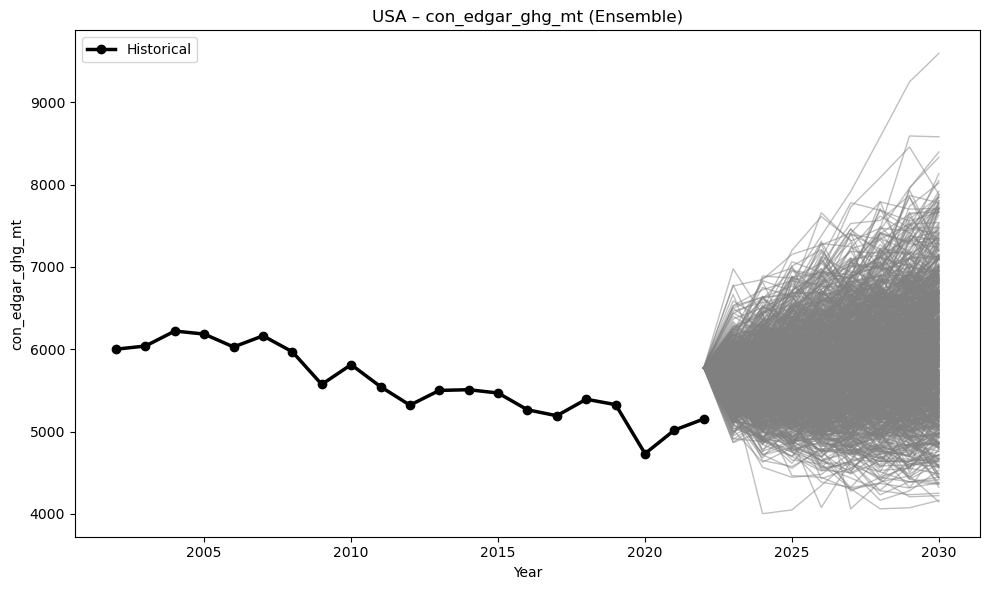

In [95]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="USA",
    column=target_variable,
    hist_df=training_df_log_transformed)

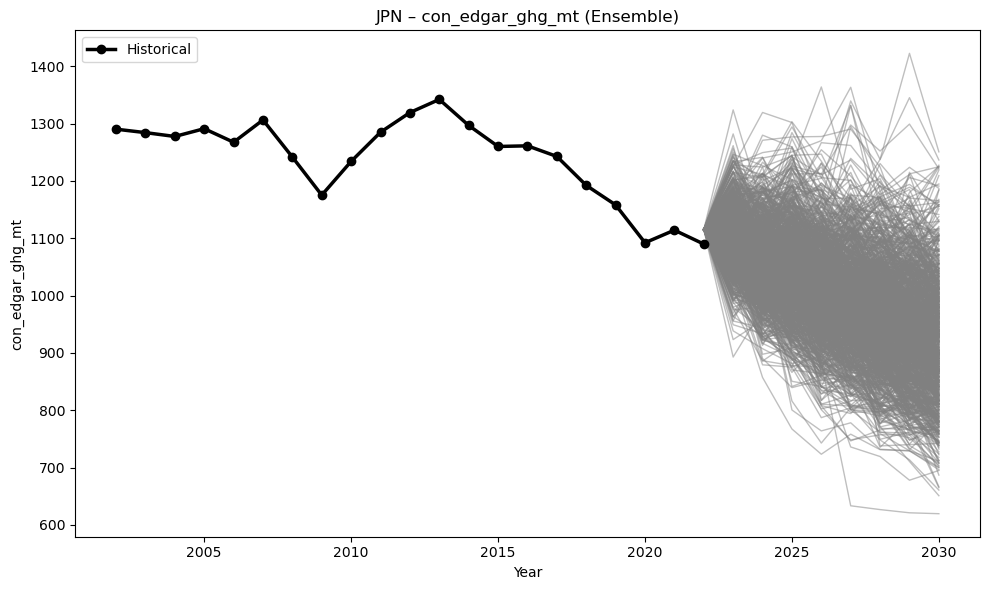

In [96]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="JPN",
    column=target_variable,
    hist_df=training_df_log_transformed)

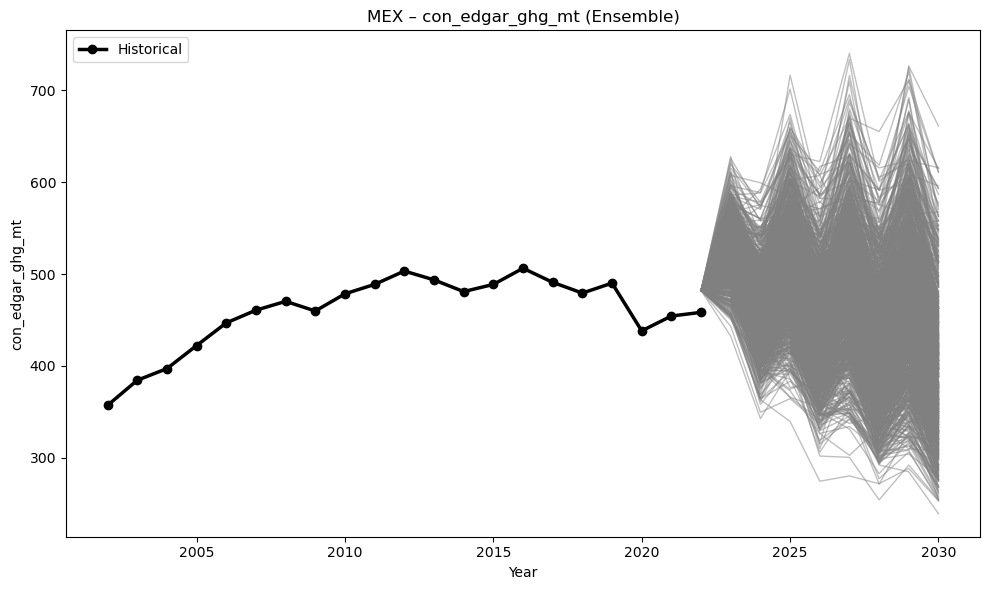

In [97]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="MEX",
    column=target_variable,
    hist_df=training_df_log_transformed)

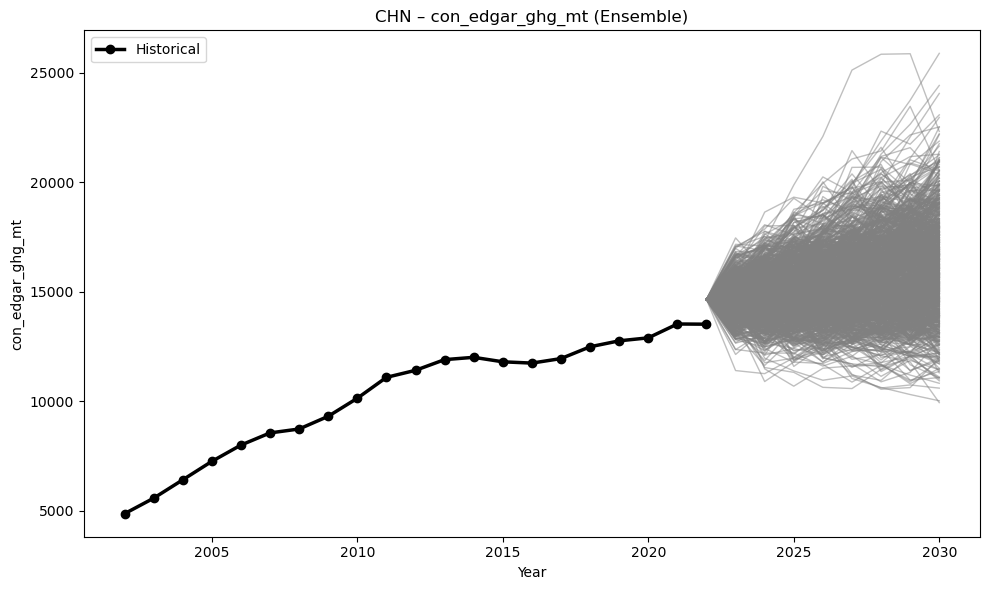

In [98]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="CHN",
    column=target_variable,
    hist_df=training_df_log_transformed)

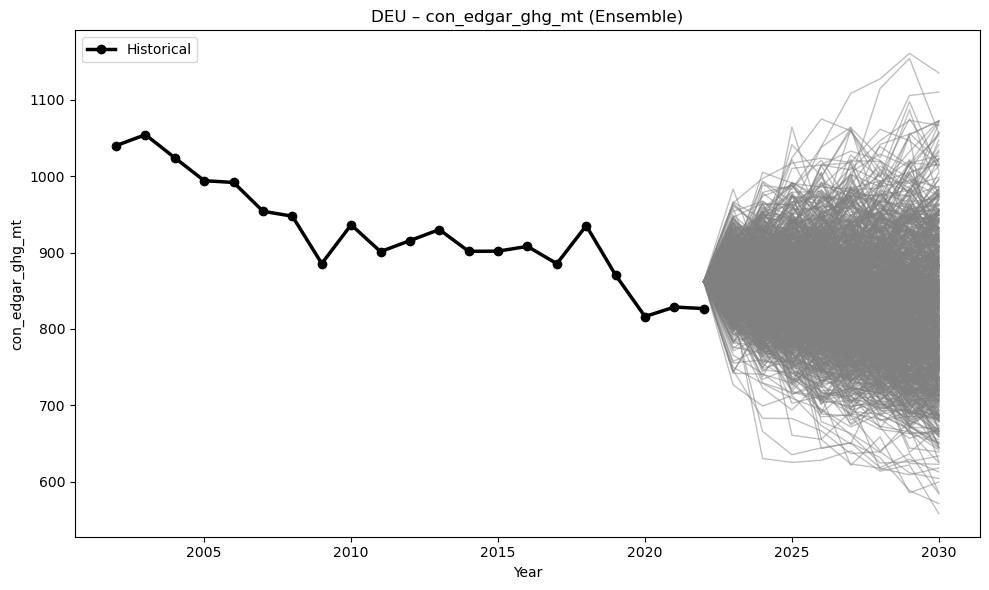

In [99]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="DEU",
    column=target_variable,
    hist_df=training_df_log_transformed)

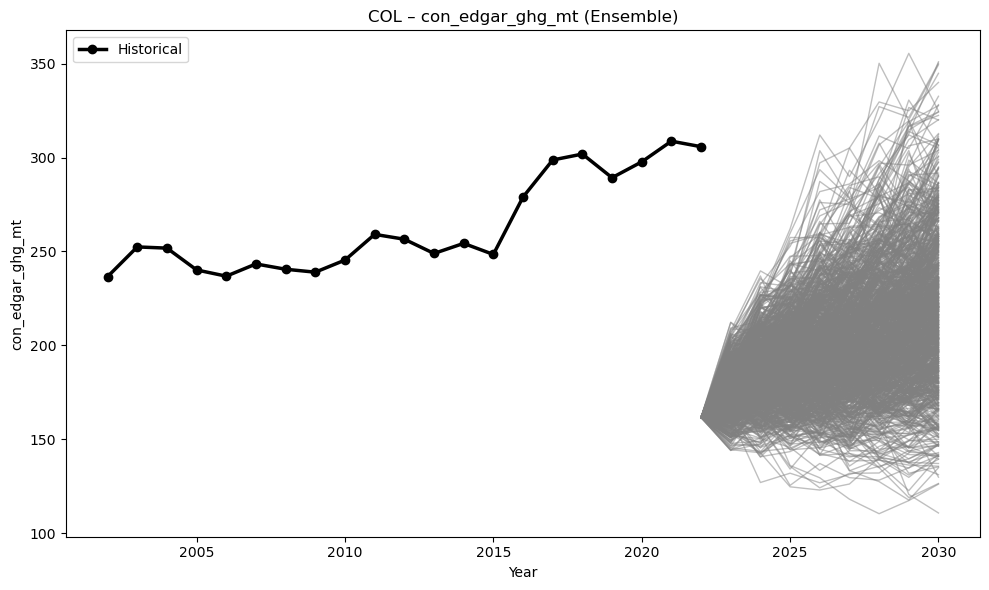

In [100]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="COL",
    column=target_variable,
    hist_df=training_df_log_transformed)

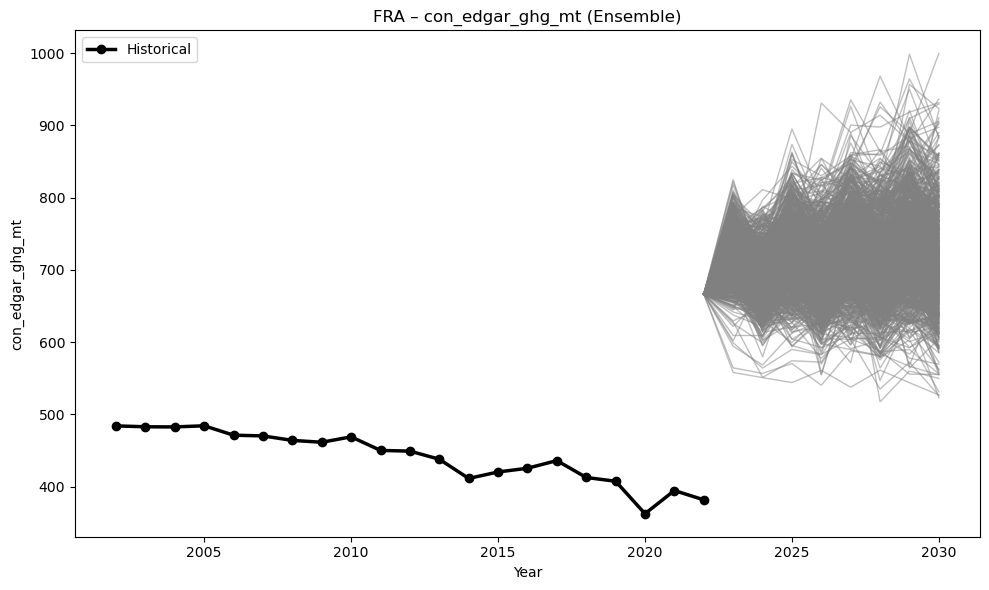

In [101]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="FRA",
    column=target_variable,
    hist_df=training_df_log_transformed)

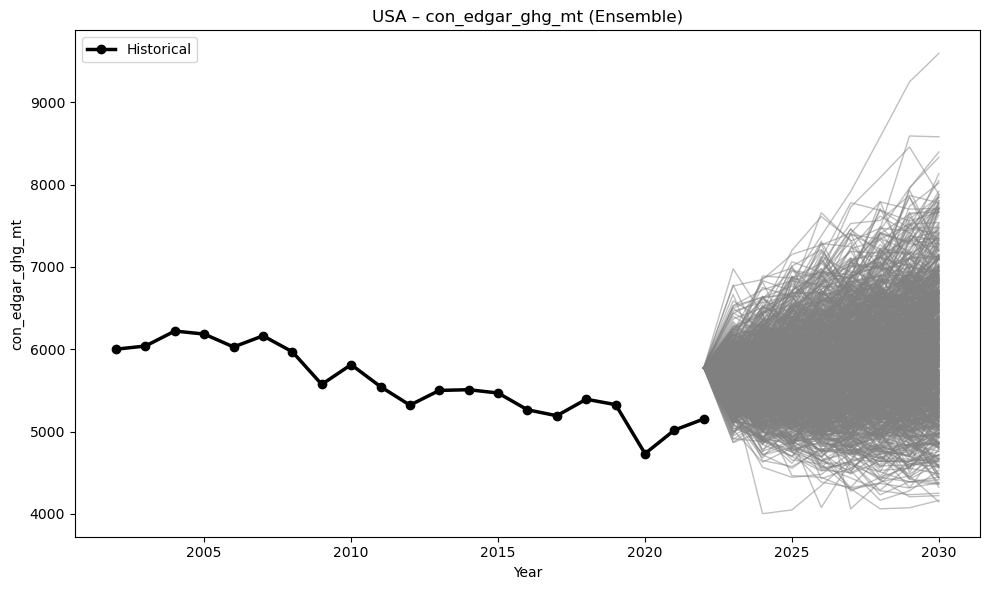

In [102]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="USA",
    column=target_variable,
    hist_df=training_df_log_transformed)

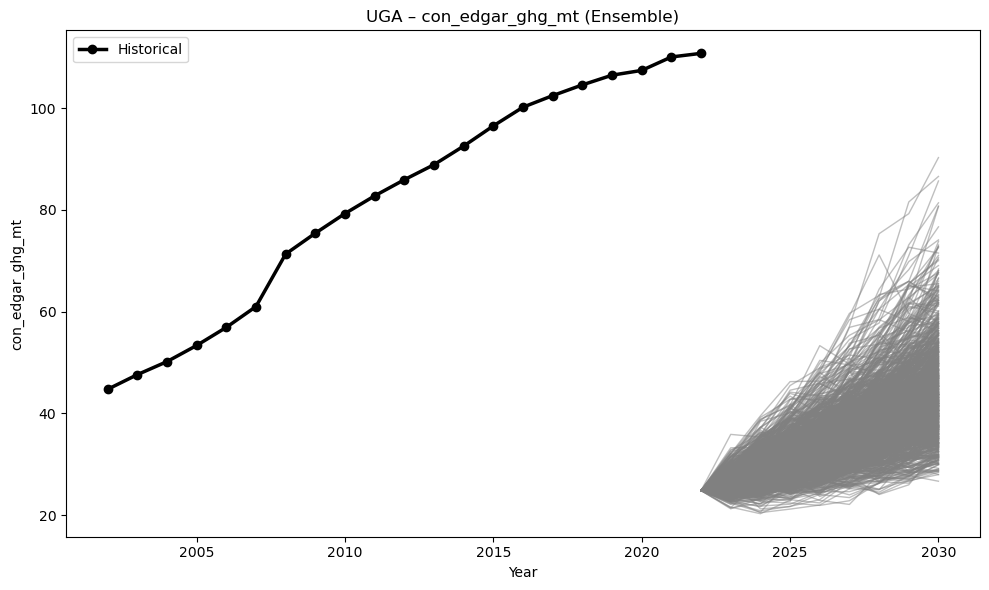

In [103]:
ep.plot_ensemble_time_series(
    df=predicted_df, 
    iso_alpha_3="UGA",
    column=target_variable,
    hist_df=training_df_log_transformed)

## Let's apply an HP filter to smooth the trayectories

In [104]:
historical_emissions_df = training_df_log_transformed[["iso_alpha_3", "year", target_variable]].copy()
historical_emissions_df.head()

,iso_alpha_3,year,con_edgar_ghg_mt
0,AFG,2002,25.774572
1,AFG,2003,26.403565
2,AFG,2004,26.539336
3,AFG,2005,26.690913
4,AFG,2006,26.884498


In [105]:
historical_emissions_df.year.max()

np.int64(2022)

In [106]:
hist_em_hp_trend_df = ep.hp_filter_panel(historical_emissions_df, which="trend", lambda_=12, keep="filtered_only")
os.makedirs(HP_FILTERED_DIR_PATH, exist_ok=True)
hist_em_hp_trend_df.to_parquet(os.path.join(HP_FILTERED_DIR_PATH, f"historical_emissions_hp_trend_{run_id}.parquet"), index=False)
hist_em_hp_trend_df.head()

,iso_alpha_3,year,con_edgar_ghg_mt_hp_trend
0,AFG,2002,24.982588
1,AFG,2003,25.648557
2,AFG,2004,26.380524
3,AFG,2005,27.307406
4,AFG,2006,28.571353


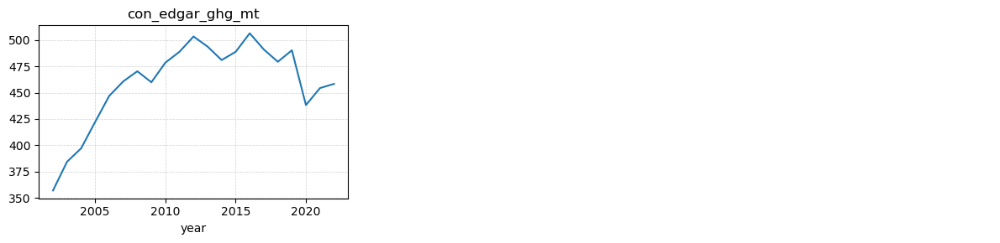

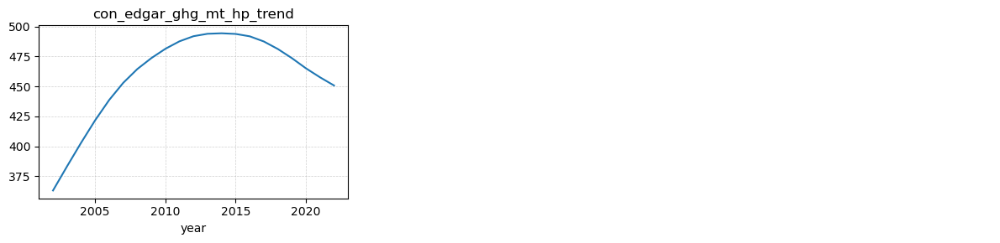

In [107]:
ep.plot_iso_numeric_subplots(historical_emissions_df, "MEX")
ep.plot_iso_numeric_subplots(hist_em_hp_trend_df, "MEX")

In [108]:
# Save it in case we need to reload it

SAVE_NEW_RUN = False

if SAVE_NEW_RUN:
    predicted_df_hp_trend = ep.hp_filter_panel_fast(predicted_df, 
                                                                which="trend", 
                                                                lambda_=6.25,
                                                                keep="filtered_only", 
                                                                id_col="future_id",
                                                                n_jobs=-1)

   # Save it in case we need to reload it
    HP_FILTERED_DIR_PATH = os.path.join(ARIMA_OUTPUT_DIR_PATH, "hp_filtered")
    predicted_df_hp_trend.to_parquet(
        os.path.join(
            HP_FILTERED_DIR_PATH,
            f"predicted_hp_filtered_{run_id}.parquet"
        ),
        index=False,
        compression="snappy"
    )
else:
    predicted_df_hp_trend = pd.read_parquet(os.path.join(HP_FILTERED_DIR_PATH, f"predicted_hp_filtered_{run_id}.parquet"))

predicted_df_hp_trend.head()

,future_id,year,iso_alpha_3,x_log_signed_con_primary_energy_twh_hp_trend,x_log_signed_con_energy_per_capita_kwh_hp_trend,x_log_signed_cap_gdp_per_capita_ppp_current_hp_trend,x_log_signed_con_demand_hp_trend,x_log_signed_con_hydro_hp_trend,cap_control_corruption_hp_trend,con_ndgain_vulnerability_hp_trend,...,x_log_signed_inc_carbon_pricing_coverage_hp_trend,inc_has_renewable_target_hp_trend,cap_voice_accountability_hp_trend,cap_liberal_democracy_idx_hp_trend,inc_has_carbon_tax_hp_trend,inc_has_efficiency_standard_hp_trend,inc_has_framework_law_hp_trend,em_lag_1y_hp_trend,x_log_signed_con_edgar_ghg_mt_hp_trend,con_edgar_ghg_mt_hp_trend
0,id_AFG_1,2022,AFG,3.793722,7.030165,7.689198,2.116663,0.392120,-1.206916,0.586954,...,-0.000038,-0.0,-1.732803,0.007166,-0.0,-0.0,-0.0,3.781724,3.066383,19.496875
1,id_AFG_1,2023,AFG,4.025925,7.057958,7.607659,2.188254,0.401599,-1.190365,0.584580,...,-0.000009,-0.0,-1.580129,0.004116,-0.0,-0.0,-0.0,3.781254,3.214379,24.347908
2,id_AFG_1,2024,AFG,4.264084,7.083233,7.521617,2.250656,0.409980,-1.170096,0.582340,...,0.000026,0.0,-1.430770,0.001839,0.0,0.0,0.0,3.782562,3.379116,29.732501
3,id_AFG_1,2025,AFG,4.494298,7.112778,7.420516,2.289029,0.416980,-1.143297,0.580358,...,0.000075,-0.0,-1.291605,0.000451,-0.0,-0.0,-0.0,3.785910,3.551465,35.516122
4,id_AFG_1,2026,AFG,4.694285,7.176002,7.301810,2.297758,0.423628,-1.110707,0.578354,...,0.000140,0.0,-1.168646,-0.000228,0.0,0.0,0.0,3.790888,3.701186,40.761816


In [109]:
predicted_df_hp_trend.columns

Index(['future_id', 'year', 'iso_alpha_3',
       'x_log_signed_con_primary_energy_twh_hp_trend',
       'x_log_signed_con_energy_per_capita_kwh_hp_trend',
       'x_log_signed_cap_gdp_per_capita_ppp_current_hp_trend',
       'x_log_signed_con_demand_hp_trend', 'x_log_signed_con_hydro_hp_trend',
       'cap_control_corruption_hp_trend', 'con_ndgain_vulnerability_hp_trend',
       'x_log_signed_con_demand_per_capita_hp_trend',
       'x_log_signed_con_coal_hp_trend', 'cap_govt_effectiveness_hp_trend',
       'x_log_signed_con_electricity_access_pct_hp_trend',
       'con_ndgain_score_hp_trend', 'cap_corruption_idx_hp_trend',
       'con_renewables_share_elec_pct_hp_trend',
       'cap_regulatory_quality_hp_trend',
       'x_log_signed_con_other_fossil_hp_trend',
       'x_log_signed_inc_carbon_pricing_coverage_hp_trend',
       'inc_has_renewable_target_hp_trend',
       'cap_voice_accountability_hp_trend',
       'cap_liberal_democracy_idx_hp_trend', 'inc_has_carbon_tax_hp_trend',
    

In [110]:
hp_trend_target_variable = target_variable + "_hp_trend"
print(hp_trend_target_variable)

con_edgar_ghg_mt_hp_trend


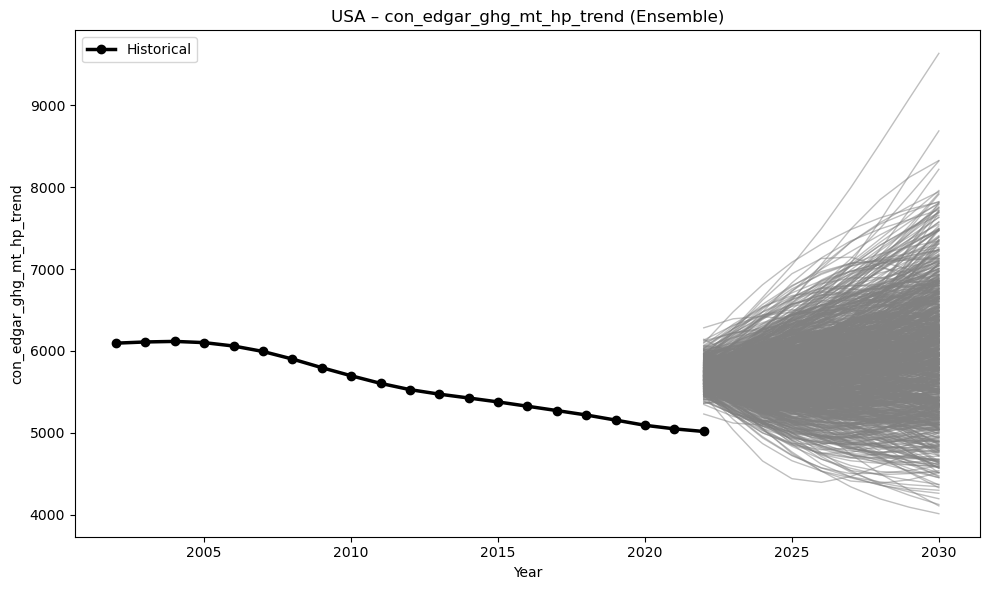

In [111]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend,
    iso_alpha_3="USA",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

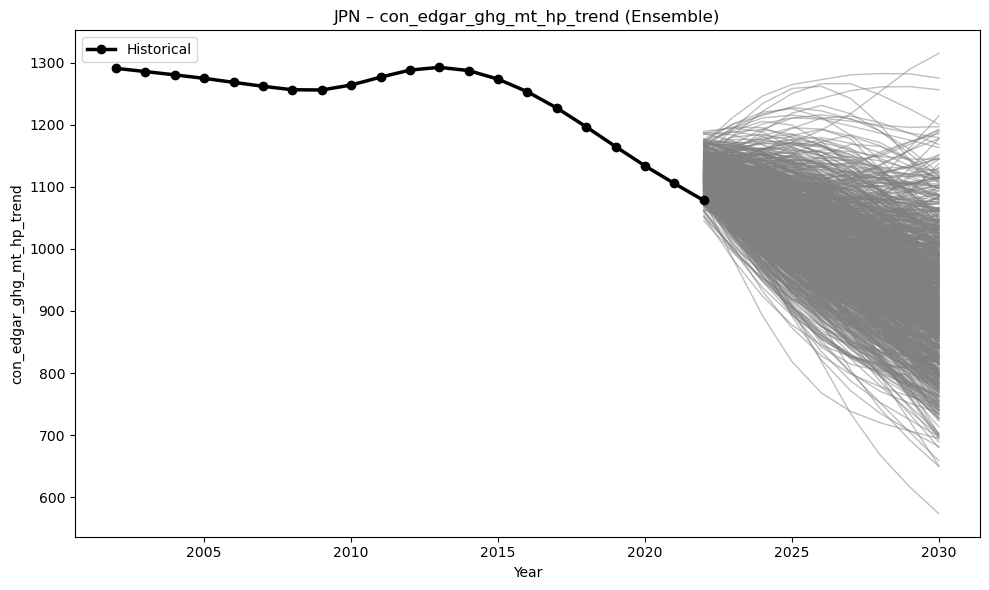

In [112]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend,
    iso_alpha_3="JPN",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

In [113]:
emission_init_cond_hp_trend_df = hist_em_hp_trend_df[hist_em_hp_trend_df["year"] == 2022].copy()
emission_init_cond_hp_trend_df = emission_init_cond_hp_trend_df.reset_index(drop=True)
emission_init_cond_hp_trend_df = emission_init_cond_hp_trend_df[["iso_alpha_3", "year", hp_trend_target_variable]]
emission_init_cond_hp_trend_df

,iso_alpha_3,year,con_edgar_ghg_mt_hp_trend
0,AFG,2022,43.312151
1,AGO,2022,135.595280
2,ALB,2022,9.290387
3,ARG,2022,425.143441
4,ARM,2022,10.670856
...,...,...,...
131,USA,2022,5016.352042
132,UZB,2022,202.202929
133,ZAF,2022,514.816948
134,ZMB,2022,2.021179


In [114]:
predicted_df_hp_trend_calibrated = ep.calibrate_to_initial_conditions(
    simulated_df=predicted_df_hp_trend,
    initial_conditions_df=emission_init_cond_hp_trend_df,
    base_year=2022,
    adjustment_method="multiplicative"
)

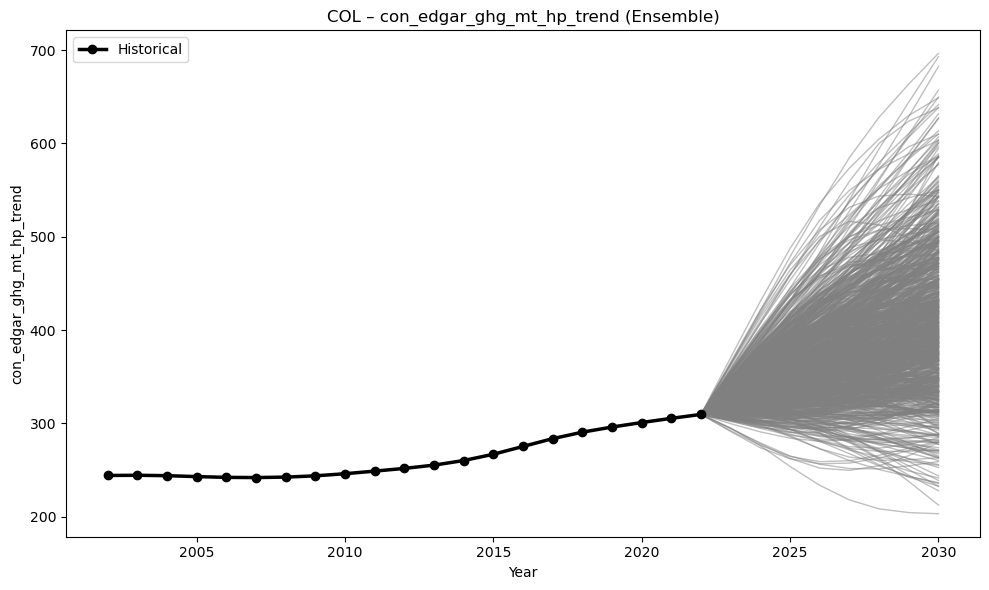

In [115]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend_calibrated,
    iso_alpha_3="COL",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

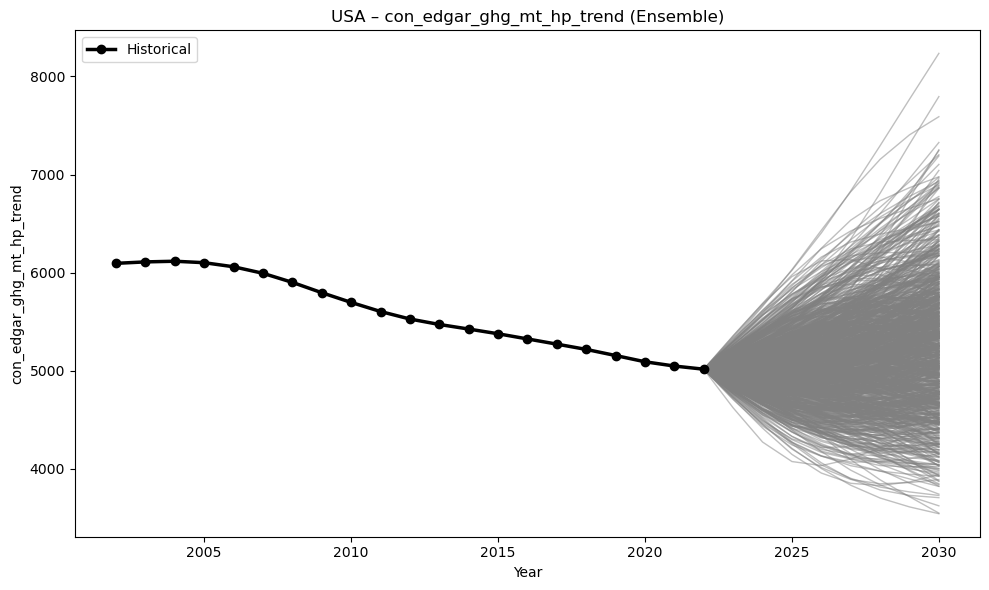

In [116]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend_calibrated,
    iso_alpha_3="USA",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

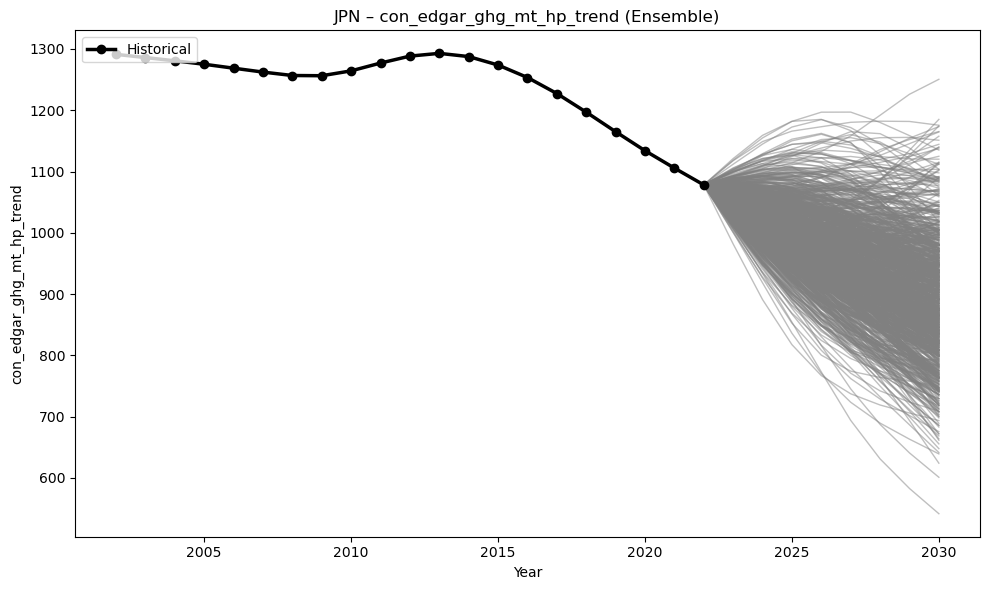

In [117]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend_calibrated,
    iso_alpha_3="JPN",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

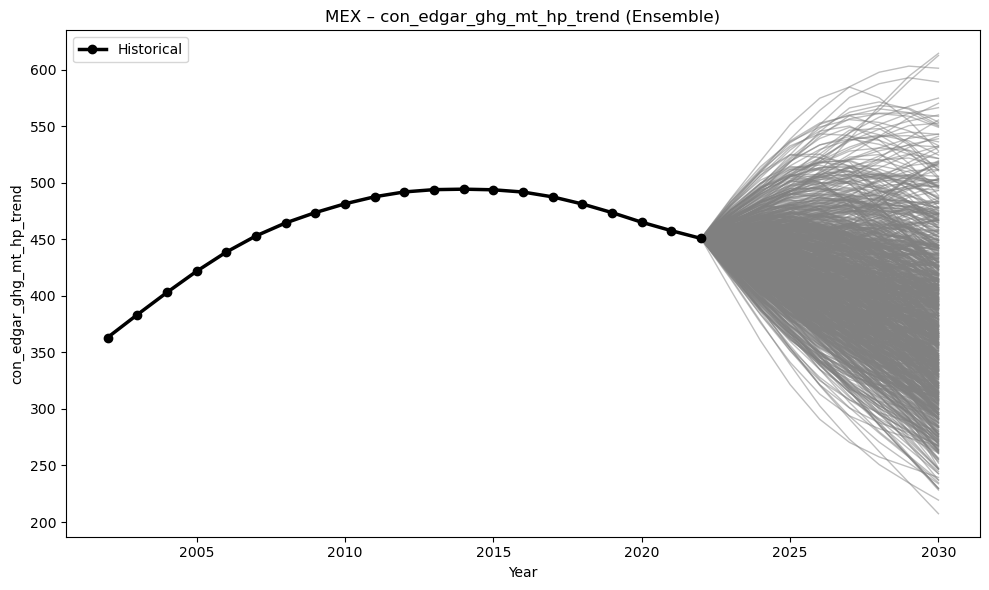

In [118]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend_calibrated,
    iso_alpha_3="MEX",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

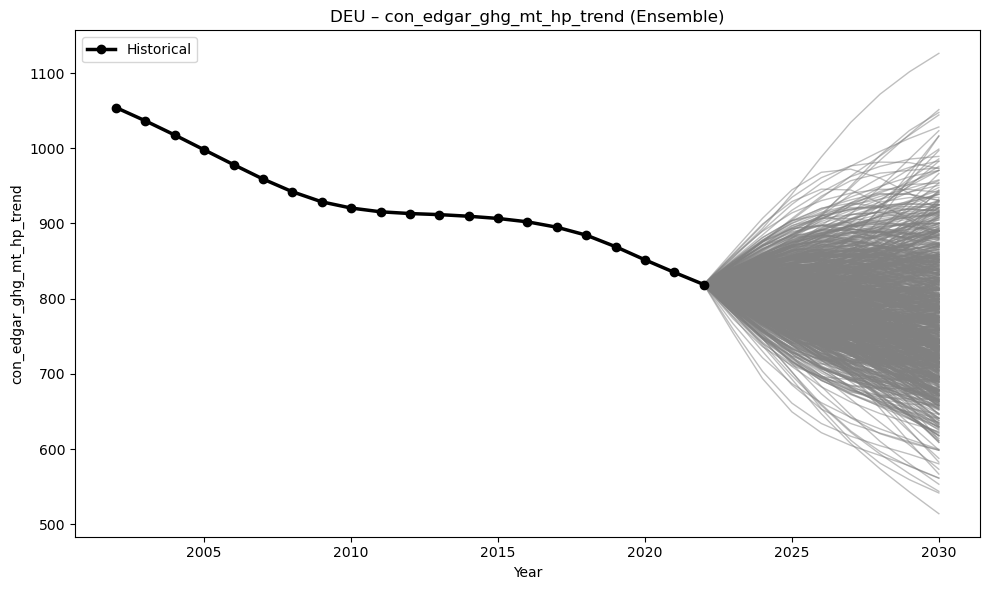

In [119]:
ep.plot_ensemble_time_series(
    df=predicted_df_hp_trend_calibrated,
    iso_alpha_3="DEU",
    column=hp_trend_target_variable,
    hist_df=hist_em_hp_trend_df)

## Dealing with Outliers

In [120]:
emissions_df = predicted_df_hp_trend_calibrated[["future_id","iso_alpha_3", "year", hp_trend_target_variable]].copy()

In [121]:
emissions_df.head()

,future_id,iso_alpha_3,year,con_edgar_ghg_mt_hp_trend
0,id_AFG_1,AFG,2022,43.312151
1,id_AFG_1,AFG,2023,54.088682
2,id_AFG_1,AFG,2024,66.050512
3,id_AFG_1,AFG,2025,78.898777
4,id_AFG_1,AFG,2026,90.552046


In [122]:
# Standard 1.5*IQR rule
clean_df, removed = ep.remove_timeseries_with_year_outliers_iqr(
    emissions_df,
    year=2030,
    iqr_multiplier=1.5,
    return_removed_ids=True,
    value_col=hp_trend_target_variable
)

print(f"Removed {len(removed)} future_id series")

Removed 3278 future_id series


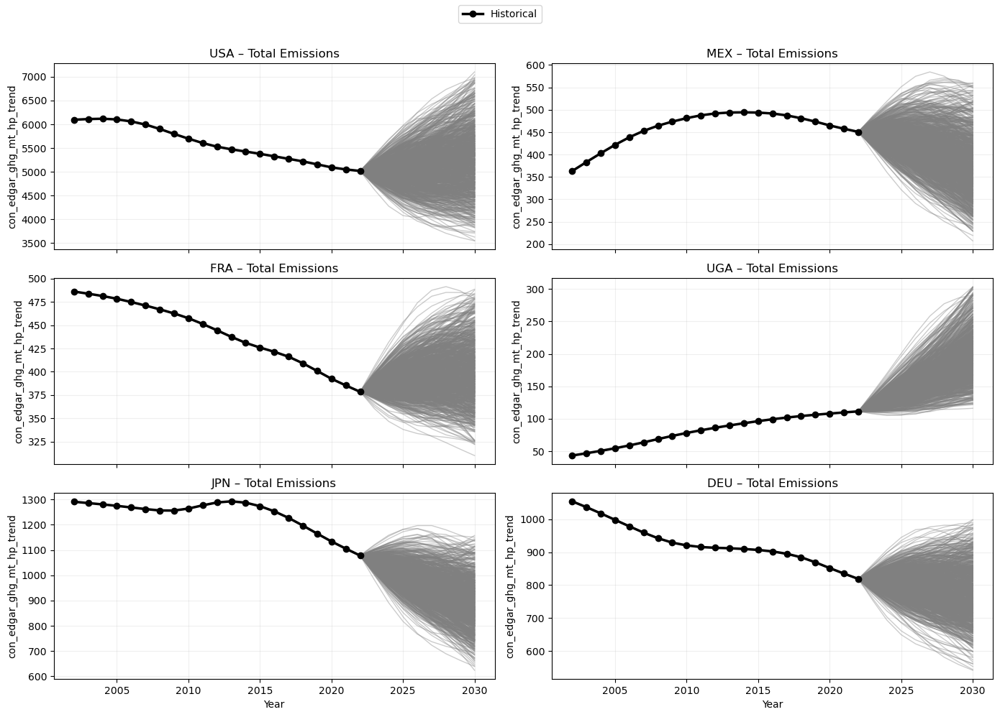

In [123]:
panels = [
    {"iso": "USA", "column": hp_trend_target_variable, "title": "USA – Total Emissions"},
    {"iso": "MEX", "column": hp_trend_target_variable, "title": "MEX – Total Emissions"},
    {"iso": "FRA", "column": hp_trend_target_variable, "title": "FRA – Total Emissions"},
    {"iso": "UGA", "column": hp_trend_target_variable, "title": "UGA – Total Emissions"},
    {"iso": "JPN", "column": hp_trend_target_variable, "title": "JPN – Total Emissions"},
    {"iso": "DEU", "column": hp_trend_target_variable, "title": "DEU – Total Emissions"},
]

ep.plot_ensemble_time_series_grid(
    df=clean_df,
    hist_df=hist_em_hp_trend_df,
    panels=panels,
    ncols=2,
    figsize=(14, 10)
)

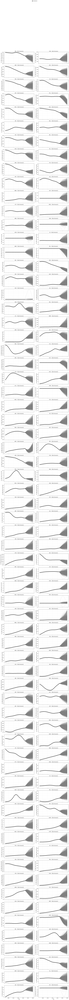

In [124]:
isos = [
    "JPN","CAN","GBR","DEU","FRA","ITA","ESP","POL","ROU","NLD","ISR","NZL","CZE","BEL","HUN",
    "IRL","DNK","FIN","SVK","LUX","BWA","CAF","CYP","MDG","BRB","GAB","COM","FJI","NAM","MLI",
    "MLT","GRC","HRV","AGO","SUR","SLV","SVN","BOL","LTU","MMR","ZMB","ZAF","BRA","CHL","ARG",
    "GUY","TTO","KGZ","ECU","CMR","MOZ","TCD","QAT","TJK","MEX","AZE","KWT","PRY","UKR","TUN",
    "PNG","PAN","MUS","SEN","TKM","STP","JAM","SLE","GEO","NPL","GIN","PER","CHN","BDI","MRT",
    "CPV","RWA","DZA","NGA","BTN","UZB","AFG","MNG","HND","MWI","TZA","BEN","BGR","LSO","IRQ",
    "IND","SWE","URY","AUT","JOR","LBY","RUS","MKD","EST","NOR","CRI","MAR","ETH","GNQ","BFA",
    "CIV","KHM","PHL","KEN","PRT","MDV","DOM","BGD","GTM","TGO","HTI","USA","PAK","TUR","GHA",
    "OMN","COL","UGA","NER","BLR","SOM","NIC","LBN","ZWE","GNB","MDA","ALB","ARM","ISL","LVA","SYC"
]

panels = [
    {
        "iso": iso,
        "column": hp_trend_target_variable,
        "title": f"{iso} – Total Emissions"
    }
    for iso in isos
]

ep.plot_ensemble_time_series_grid(
    df=clean_df,
    hist_df=hist_em_hp_trend_df,
    panels=panels,
    ncols=2,
    figsize=(14, 200),
    # save_path=os.path.join(IMG_DIR_PATH, "emissions_2030.pdf")
)

In [62]:
# panels = [
#     {
#         "iso": iso,
#         "column": "con_edgar_ghg_mt",
#         "title": f"{iso} – Total Emissions"
#     }
#     for iso in isos
# ]

# ep.plot_ensemble_time_series_grid(
#     df=predicted_df, 
#     hist_df=training_df_log_transformed,
#     panels=panels,
#     ncols=2,
#     figsize=(14, 200))

In [125]:
# Drop some countries with unrealistic projections or data issues
outlier_isos = [
    "KWT",
    "PRY",
    "SOM"
]

clean_df_no_outliers = clean_df[~clean_df["iso_alpha_3"].isin(outlier_isos)].copy()

In [126]:
clean_df_no_outliers.to_parquet(
    os.path.join(
        POSTPROCESSING_DIR_PATH,
        f"postprocessed_ensemble_{run_id}.parquet"
    ),
    index=False,
    compression="snappy"
)